In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import numpy as np
import os
import PIL
import PIL.Image
import tensorflow as tf
import tensorflow_datasets as tfds

In [ ]:
shared_dir = os.path.join(os.getcwd(), 'drive', 'Shareddrives', 'Computer Vision Final Project')


In [ ]:
# store the images locally to avoid io bottleneck
%%time
!cp "/content/drive/Shareddrives/Computer Vision Final Project/ports_dataset.zip" .
!unzip -q ports_dataset.zip
!rm ports_dataset.zip

CPU times: user 22.9 ms, sys: 33.8 ms, total: 56.7 ms
Wall time: 2.16 s


In [ ]:
%cd /content/

import shutil

shutil.rmtree('./train/question_multiple')
shutil.rmtree('./train/sheep_multiple')
shutil.rmtree('./train/stone_multiple')

shutil.rmtree('./valid/question_multiple')

/content


In [ ]:
shutil.rmtree('./train/brick_multiple')


In [ ]:
# turn the folders into TF datasets
batch_size = 32
img_height = 128
img_width = 128

train_ds = tf.keras.utils.image_dataset_from_directory(
  'train',
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = tf.keras.utils.image_dataset_from_directory(
  'valid',
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

test_ds = tf.keras.utils.image_dataset_from_directory(
  'test',
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 1653 files belonging to 7 classes.
Using 1323 files for training.
Found 160 files belonging to 6 classes.
Using 32 files for validation.
Found 81 files belonging to 6 classes.


In [ ]:
# cache the images in memory during the first epoch

AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
num_classes = 6

model = tf.keras.Sequential([
  tf.keras.layers.Rescaling(1./255),
  tf.keras.layers.Conv2D(32, 3, activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Conv2D(32, 3, activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Conv2D(32, 3, activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dense(num_classes)
])

In [ ]:
model.compile(
  optimizer='adam',
  loss=tf.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

In [ ]:
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=15
)

Epoch 1/15
42/42 [==============================] - 25s 565ms/step - loss: 1.5151 - accuracy: 0.4492 - val_loss: 1.3180 - val_accuracy: 0.3750
Epoch 2/15
42/42 [==============================] - 22s 531ms/step - loss: 0.8228 - accuracy: 0.6700 - val_loss: 0.7316 - val_accuracy: 0.6250
Epoch 3/15
42/42 [==============================] - 23s 540ms/step - loss: 0.4352 - accuracy: 0.8255 - val_loss: 0.6387 - val_accuracy: 0.8125
Epoch 4/15
42/42 [==============================] - 23s 536ms/step - loss: 0.2651 - accuracy: 0.9029 - val_loss: 0.6673 - val_accuracy: 0.7812
Epoch 5/15
42/42 [==============================] - 22s 535ms/step - loss: 0.1486 - accuracy: 0.9530 - val_loss: 0.4388 - val_accuracy: 0.8750
Epoch 6/15
42/42 [==============================] - 23s 536ms/step - loss: 0.1040 - accuracy: 0.9674 - val_loss: 0.3021 - val_accuracy: 0.9062
Epoch 7/15
42/42 [==============================] - 23s 538ms/step - loss: 0.0862 - accuracy: 0.9750 - val_loss: 0.2750 - val_accuracy: 0.9375

1/1 - 0s - loss: 0.2512 - accuracy: 0.9688 - 146ms/epoch - 146ms/step


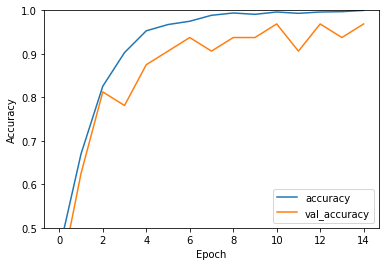

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')

test_loss, test_acc = model.evaluate(val_ds, verbose=2)

In [ ]:
result = model.evaluate(test_ds)
dict(zip(model.metrics_names, result))

3/3 [==============================] - 0s 128ms/step - loss: 0.0985 - accuracy: 0.9753


{'accuracy': 0.9753086566925049, 'loss': 0.09849181771278381}

In [ ]:
model.save(os.path.join(shared_dir, 'models', 'ship_detection_model_2'), save_format='h5')

In [ ]:
model = tf.keras.models.load_model('/content/drive/Shareddrives/Computer Vision Final Project/models/ship_detection_model_2')

# Check its architecture
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 128, 128, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        9248      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 30, 30, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 32)        9

In [ ]:
# save the model to a json format
model_json = model.to_json()

with open("model.json", "w") as json_file:
    json_file.write(model_json)

In [ ]:
# serialize weights to h5
model.save_weights('model.h5')

In [ ]:
# export the whole model to h5
model.save('full_model.h5')

In [ ]:
os.path.join(shared_dir, 'Test photos', 'test5_1.jpg')

'/content/drive/Shareddrives/Computer Vision Final Project/Test photos/test5_1.jpg'

In [ ]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
import imutils
############################################
# Read image and get canny edge detection
############################################

# read img
img = cv.imread('/content/drive/Shareddrives/Computer Vision Final Project/Test photos/test5_1.jpg')[:,:,::-1]
img = imutils.resize(img, width=2000)

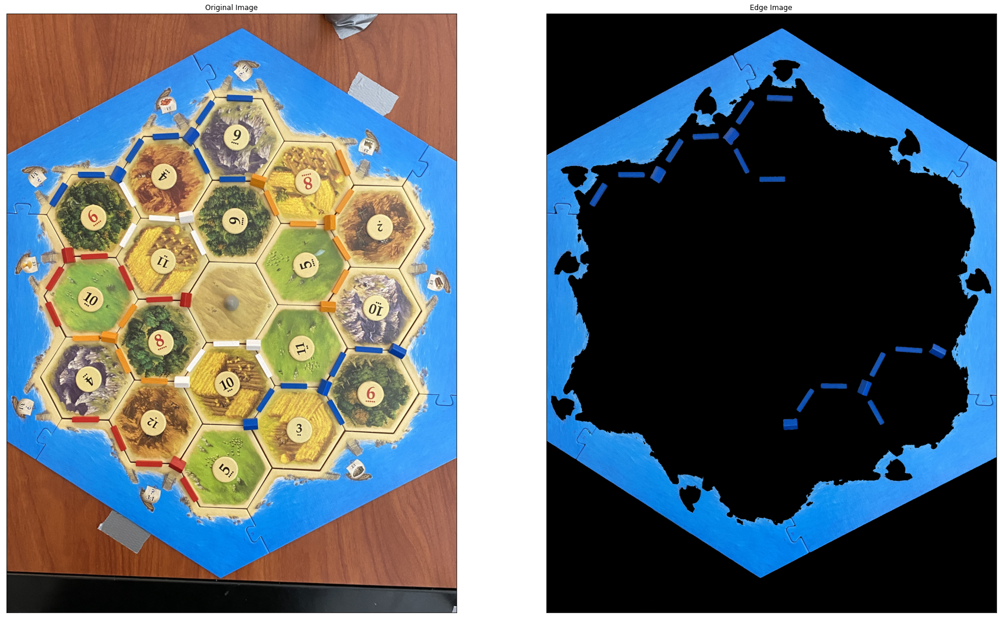

In [ ]:
################
# Get blue mask
################

# create boundaries
hsv = cv.cvtColor(img, cv.COLOR_RGB2HSV)
blue_lower=np.array([80,140,0],np.uint8)
blue_upper=np.array([140,255,255],np.uint8)

# find mask
blue_mask = cv.inRange(hsv, blue_lower, blue_upper)

# see img
res = cv.bitwise_and(img,img, mask= blue_mask)
plt.figure(figsize=(30, 30))
plt.subplot(121),plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(res)
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
plt.show()

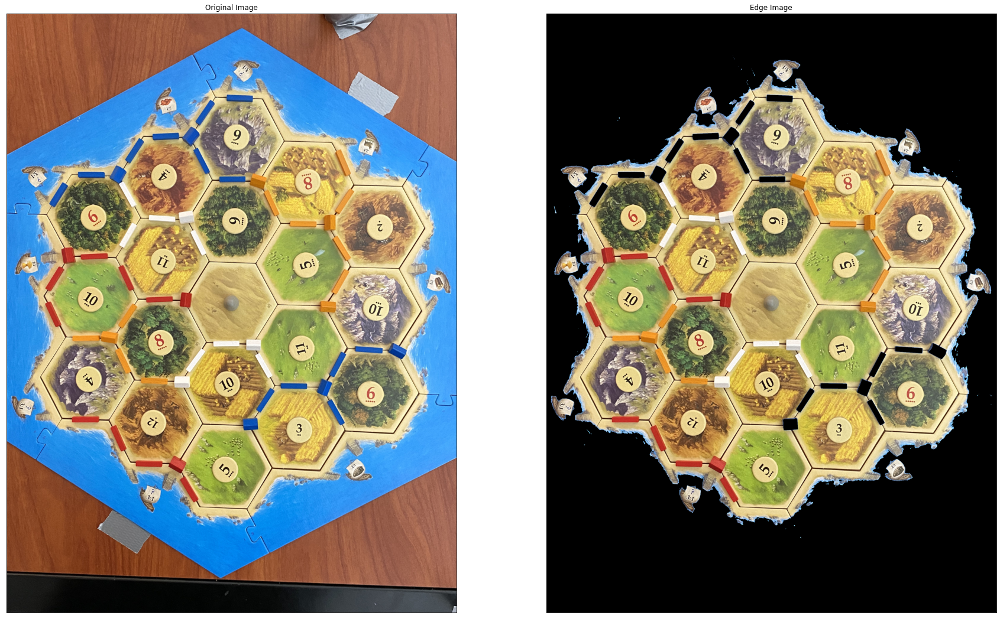

In [ ]:
############################
# Expand blue mask outwards
############################

# create masks
blue_mask_binary = img.copy()
h, w = img.shape[:2]
flood_mask = np.zeros((h+2, w+2), np.uint8)

# flood fill the 4 corners
cv.floodFill(blue_mask, flood_mask, (0,0), 255)
cv.floodFill(blue_mask, flood_mask, (w-1,0), 255)
cv.floodFill(blue_mask, flood_mask, (0,h-1), 255)
cv.floodFill(blue_mask, flood_mask, (w-1,h-1), 255)

# see img
blue_mask_inv = cv.bitwise_not(blue_mask)
cropped_img = cv.bitwise_and(img,img, mask=blue_mask_inv)
plt.figure(figsize=(30, 30))
plt.subplot(121),plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(cropped_img)
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
plt.show()

1290
1000


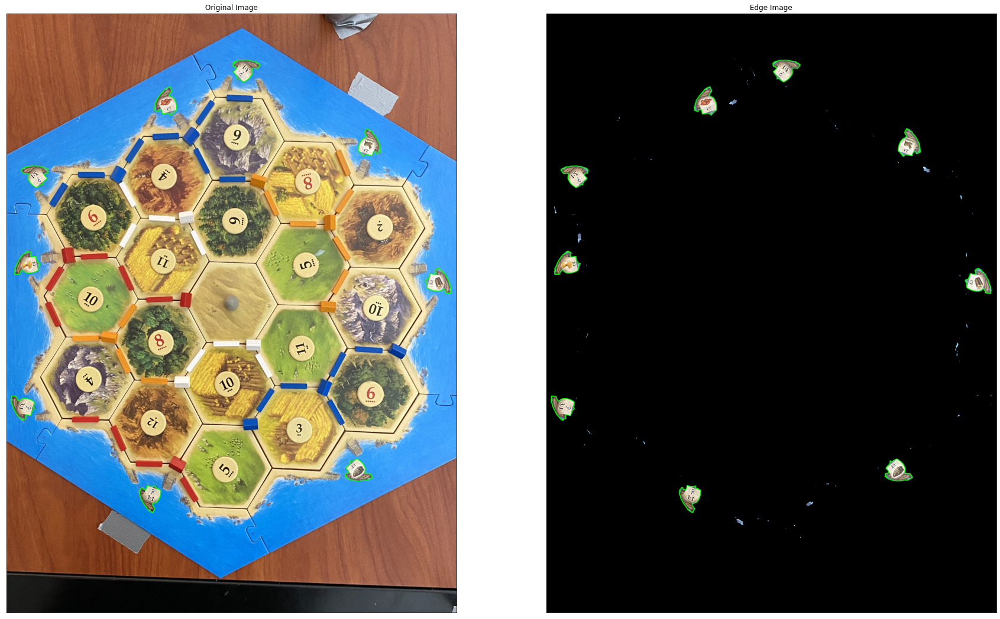

In [ ]:
####################
# Get ship contours
####################

# get center of mass
mass_x, mass_y = np.where(blue_mask <= 0)
cent_x = int(np.average(mass_x))
cent_y = int(np.average(mass_y))
print(cent_x)
print(cent_y)

# get ship mask
ship_flood_mask = np.zeros((h+2, w+2), np.uint8)
ship_mask = blue_mask.copy()
cv.floodFill(ship_mask, ship_flood_mask, (cent_x,cent_y), 255)
ship_mask_inv = cv.bitwise_not(ship_mask)

# find contours
contours, hierarchy = cv.findContours(image=ship_mask_inv, mode=cv.RETR_TREE, method=cv.CHAIN_APPROX_NONE)

# sort contours in decreasing order and take first 9
contours = sorted(contours, key=lambda x:cv.contourArea(x), reverse=True)
contours = contours[0:9]

# draw contours on the original image
image_copy = img.copy()
cv.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv.LINE_AA)
ship_img = cv.bitwise_and(img,img, mask=ship_mask_inv)
cv.drawContours(image=ship_img, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv.LINE_AA)

# see ship img
plt.figure(figsize=(30, 30))
plt.subplot(121),plt.imshow(image_copy)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(ship_img)
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
plt.show()


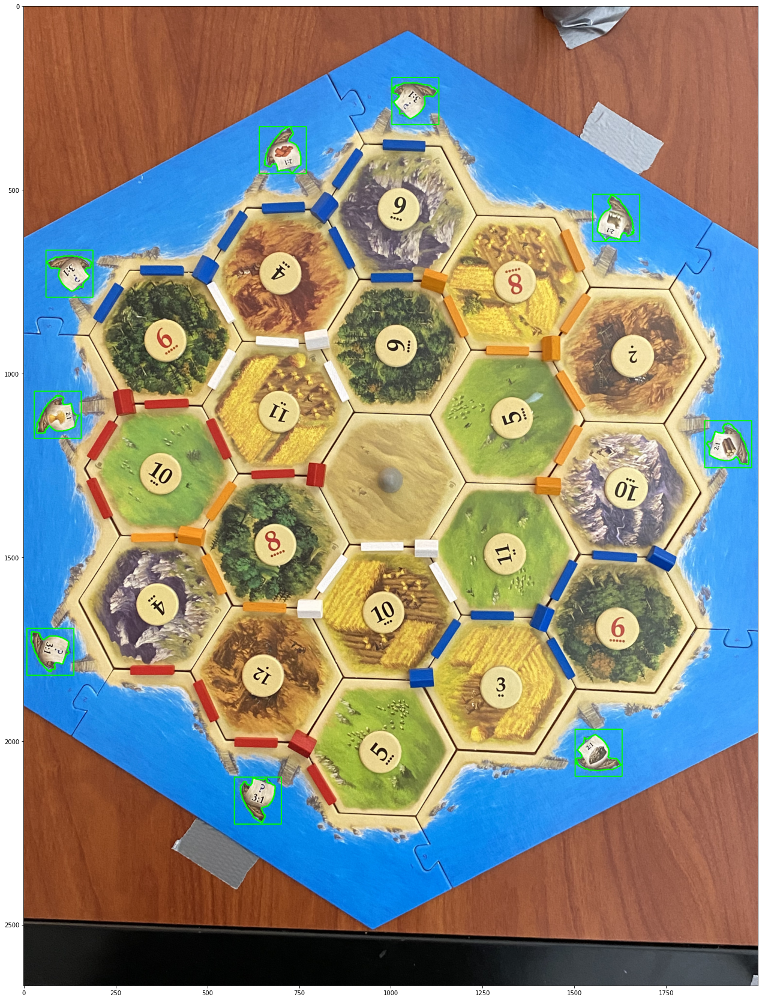

In [ ]:
# store extracted ports
ports_extracted = []

# get the bounding box of all the contours
for contour in contours:
    x,y,w,h = cv.boundingRect(contour)

    # cv.rectangle(img=image_copy, pt1=(x,y), pt2=(x+w,y+h), color=(0, 255, 0), thickness=2)

    # get a rectange of 128x128 with the original rectangle at the center
    hor_diff = int((w-128)/2)
    ver_diff = int((h-128)/2)

    # draw the rectangle on the original image
    cv.rectangle(img=image_copy, pt1=(x+hor_diff,y+ver_diff), pt2=(x+hor_diff+128,y+ver_diff+128), color=(0, 255, 0), thickness=2)

    # get the rectangle
    ports_extracted.append(img[y+ver_diff+1:y+h-ver_diff, x+hor_diff+1:x+w-hor_diff])
# show the image
plt.figure(figsize=(30, 30))
plt.imshow(image_copy)

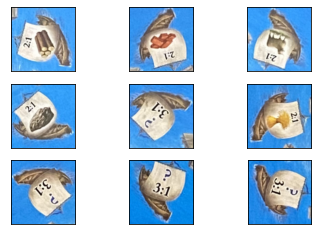

In [ ]:
# show the extracted ports in a 9x9 grid
for i in range(len(ports_extracted)):
    plt.subplot(3,3,i+1),plt.imshow(ports_extracted[i])
    plt.xticks([]), plt.yticks([])

plt.show()


In [ ]:
class_names = test_ds.class_names
class_names

['brick', 'question', 'sheep', 'stone', 'wheat', 'wood']

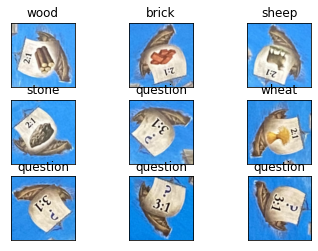

In [ ]:
# make model predictions on extracted ports
# show the extracted ports in a 9x9 grid
for i in range(len(ports_extracted)):

    # predict on the model
    prediction = model.predict(np.expand_dims(ports_extracted[i], axis=0))

    idx = np.argmax(prediction)

    cls = class_names[idx]


    ax = plt.subplot(3,3,i+1)
    ax.title.set_text(cls)

    plt.imshow(ports_extracted[i])
    plt.xticks([]), plt.yticks([])

plt.show()
